Выполним необходимые импорты

In [1]:
import os
import random
import math
import warnings

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from typing import Tuple
import pandas as pd

import kagglehub
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as T
from PIL import Image
import timm

import shap
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic
from captum.attr import IntegratedGradients, LayerGradCam
from scipy.ndimage import zoom

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8')

In [2]:
SEED = 42
MAX_IMAGES = 23684
TRAIN_VAL_SPLIT = 0.8
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 5
LR = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)

print(DEVICE)

cuda


Загрузим датасет c [KaggleHub](https://www.kaggle.com/datasets/jangedoo/utkface-new)

In [3]:
dataset_path = kagglehub.dataset_download("jangedoo/utkface-new")

if os.path.isdir(os.path.join(dataset_path, "UTKFace")):
    DATA_DIR = os.path.join(dataset_path, "UTKFace")
else:
    DATA_DIR = dataset_path
    
print(DATA_DIR)

/home/alex/.cache/kagglehub/datasets/jangedoo/utkface-new/versions/1/UTKFace


In [4]:
class UTKFaceDataset(Dataset):
    def __init__(self, root_dir, transform, max_images):
        self.root_dir = root_dir
        self.transform = transform
        self.files = []
        self.ages = []
        self.genders = []
        self.races = []

        for fname in os.listdir(root_dir):
            if fname.endswith(".jpg"):
                parts = fname.split("_")
                if len(parts) >= 3 and all(p.isdigit() for p in parts[:3]):
                    age, gender, race = map(int, parts[:3])
                    if 0 <= age <= 100:
                        self.files.append(fname)
                        self.ages.append(age)
                        self.genders.append(gender)
                        self.races.append(race)

        if max_images is not None and len(self.files) > max_images:
            indices = np.random.choice(len(self.files), max_images, replace=False)
            self.files = [self.files[i] for i in indices]
            self.ages = [self.ages[i] for i in indices]
            self.genders = [self.genders[i] for i in indices]
            self.races = [self.races[i] for i in indices]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname = self.files[idx]
        img_path = os.path.join(self.root_dir, fname)
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        age = float(self.ages[idx])
        gender = self.genders[idx]  # 0 = male, 1 = female
        race = self.races[idx]
        return img, age, gender, race

train_tf = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(0.5),
    T.RandomRotation(10),
    T.ColorJitter(brightness=0.2, contrast=0.2),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

val_tf = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

full_ds = UTKFaceDataset(DATA_DIR, transform=train_tf, max_images=MAX_IMAGES)
train_len = int(TRAIN_VAL_SPLIT * len(full_ds))
val_len = len(full_ds) - train_len

train_ds, val_ds = random_split(full_ds, [train_len, val_len], generator=torch.Generator().manual_seed(SEED))
val_ds.dataset.transform = val_tf

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

print(f"total images = {len(full_ds)}")
print(f"train = {len(train_ds)}, val = {len(val_ds)}")

total images = 23684
train = 18947, val = 4737


Загружаем предобученную модель [efficientnet_b0](https://docs.pytorch.org/vision/main/models/generated/torchvision.models.efficientnet_b0.html) для бинарной классификации

In [5]:
model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=1)
model.classifier = nn.Sequential(
    nn.Dropout(0.4),
    nn.Linear(model.classifier.in_features, 1)
)

model = model.to(DEVICE)
print(DEVICE)

criterion = nn.BCEWithLogitsLoss()  # бинарная кросс-энтропия
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)

cuda


Дообучим модель на нашем датасете для предсказания пола

Epoch 1/5 | Train Loss: 0.3039, Acc: 86.52% | Val Loss: 0.1998, Acc: 91.87%


Epoch 2/5 | Train Loss: 0.1589, Acc: 93.75% | Val Loss: 0.1858, Acc: 92.51%


Epoch 3/5 | Train Loss: 0.0903, Acc: 96.66% | Val Loss: 0.2081, Acc: 92.59%


Epoch 4/5 | Train Loss: 0.0487, Acc: 98.28% | Val Loss: 0.2758, Acc: 92.04%


Epoch 5/5 | Train Loss: 0.0332, Acc: 98.78% | Val Loss: 0.3113, Acc: 92.46%


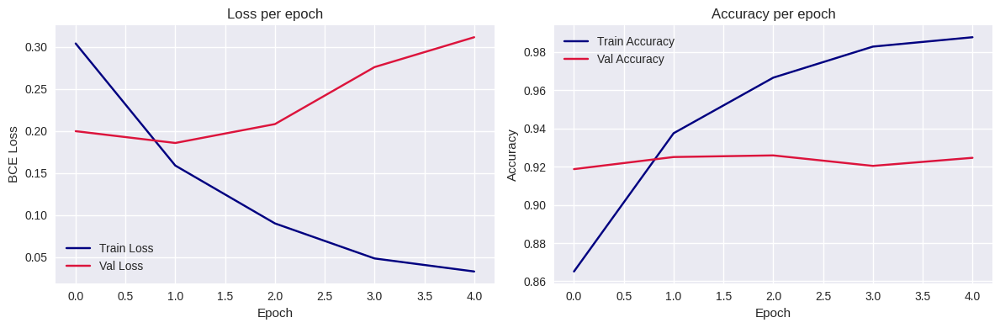

In [6]:
def run_epoch(loader, is_train):
    if is_train:
        model.train()
    else:
        model.eval()
    total_loss = 0
    total_correct = 0
    total_samples = 0

    if is_train:
        data_iter = tqdm(loader, leave=False)
    else:
        data_iter = loader

    for batch in data_iter:
        images, ages, genders = batch[0], batch[1], batch[2]
        images = images.to(DEVICE)
        targets = genders.to(DEVICE).unsqueeze(1).float()

        if is_train:
            optimizer.zero_grad()

        with torch.set_grad_enabled(is_train):
            outputs = model(images)
            loss = criterion(outputs, targets)
            predictions = torch.sigmoid(outputs) > 0.5
            correct = (predictions == targets).sum().item()

            if is_train:
                loss.backward()
                optimizer.step()

        batch_sz = images.size(0)
        total_loss += loss.item() * batch_sz
        total_correct += correct
        total_samples += batch_sz

    avg_loss = total_loss / total_samples
    accuracy = total_correct / total_samples
    return avg_loss, accuracy

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(EPOCHS):
    train_loss, train_acc = run_epoch(train_loader, True)
    val_loss, val_acc = run_epoch(val_loader, False)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)

    scheduler.step(val_loss)

    print("Epoch {}/{} | Train Loss: {:.4f}, Acc: {:.2f}% | Val Loss: {:.4f}, Acc: {:.2f}%".format(
        epoch + 1, EPOCHS, train_loss, train_acc*100, val_loss, val_acc*100
    ))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(train_losses, label='Train Loss', color='navy')
ax1.plot(val_losses, label='Val Loss', color='crimson')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('BCE Loss')
ax1.set_title('Loss per epoch')
ax1.legend()
ax1.grid(True)

ax2.plot(train_accuracies, label='Train Accuracy', color='navy')
ax2.plot(val_accuracies, label='Val Accuracy', color='crimson')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.set_title('Accuracy per epoch')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

1. Значительно снизить loss на валидационной выборке не вышло (видно, что он стабильно держится в диапазоне $[0.2;0.3]$);
2. Accuracy выходит на плато $\approx 0.92$ и тоже не меняется.

Некоторые вспомогательные функции для визуализации

In [7]:
def denormalize_image(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406], device=tensor.device).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], device=tensor.device).view(3, 1, 1)
    img = tensor * std + mean
    return torch.clamp(img, 0, 1)

def shap_to_2d(attr, h, w):
    arr = np.array(attr).squeeze()
    if arr.ndim == 3:
        if arr.shape[0] in (1, 3) and arr.shape[1:] == (h, w):
            arr = arr.mean(axis=0)
        elif arr.shape[-1] in (1, 3) and arr.shape[:2] == (h, w):
            arr = arr.mean(axis=-1)
        else:
            arr = arr.mean(axis=-1)
    elif arr.ndim == 1 and arr.size == h * w:
        arr = arr.reshape(h, w)
    elif arr.ndim != 2:
        arr = np.zeros((h, w), dtype=float)
    return arr

def create_heatmap_overlay(img, attr_2d, alpha=0.6):
    img_np = denormalize_image(img.cpu()).numpy().transpose(1, 2, 0)
    h, w, _ = img_np.shape

    vmax = np.percentile(np.abs(attr_2d), 99)
    if vmax > 0:
        norm = attr_2d / vmax
    else:
        norm = attr_2d
    heatmap = plt.cm.RdBu_r((norm * 0.5 + 0.5))[..., :3]

    if heatmap.shape[:2] != (h, w):
        heatmap = np.array(
            Image.fromarray((heatmap * 255).astype(np.uint8)).resize((w, h), resample=Image.BILINEAR)
        ) / 255.0

    overlay = (1 - alpha) * img_np + alpha * heatmap
    return np.clip(overlay, 0, 1)

Подготовка данных для интерпретации

In [8]:
model.eval()
val_iter = iter(val_loader)
val_batch = next(val_iter)
sample_images, sample_ages, sample_genders, sample_races = val_batch

n_samples = 6
sample_images = sample_images[:n_samples].to(DEVICE)
sample_genders = sample_genders[:n_samples]

with torch.no_grad():
    logits = model(sample_images).cpu().numpy().flatten()
    predictions = torch.sigmoid(torch.tensor(logits)).numpy()

SHAP анализ

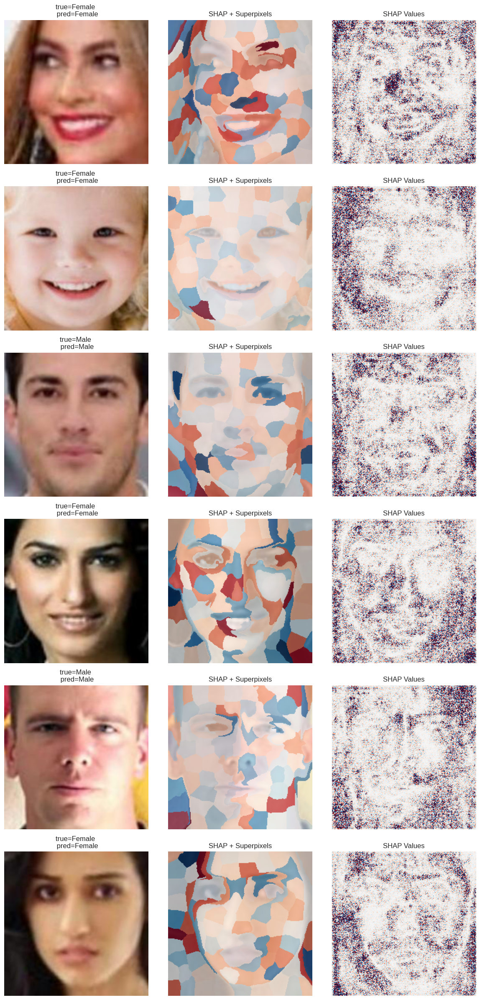

In [9]:
batch = next(iter(train_loader))
background = batch[0][:4].to(DEVICE)
background_cpu = background.cpu()

model_cpu = model.eval().cpu()
explainer_shap = shap.GradientExplainer(model_cpu, background_cpu)

shap_values = []
for img in sample_images:
    img_cpu = img.unsqueeze(0).cpu()
    shap_val = explainer_shap.shap_values(img_cpu, nsamples=30)
    arr = shap_val[0] if isinstance(shap_val, list) else shap_val
    if arr.ndim == 4 and arr.shape[1] == 3:
        arr = arr.transpose(0, 2, 3, 1)[0]
    shap_values.append(arr)

shap_array = np.stack(shap_values, axis=0)

fig, axes = plt.subplots(n_samples, 3, figsize=(12, 4 * n_samples))
axes = axes.reshape(n_samples, 3)

for i in range(n_samples):
    img_t = sample_images[i]
    h, w = IMG_SIZE, IMG_SIZE
    shap_gray = shap_to_2d(shap_array[i], h, w)

    orig = denormalize_image(img_t).cpu().numpy().transpose(1, 2, 0)
    axes[i, 0].imshow(orig)
    gender_label = "Female" if sample_genders[i] == 1 else "Male"
    pred_label = "Female" if predictions[i] > 0.5 else "Male"
    axes[i, 0].set_title(f'true={gender_label} \n pred={pred_label}')
    axes[i, 0].axis('off')

    segments = slic(orig, n_segments=100, compactness=10, sigma=1)
    sp_map = np.zeros_like(segments, dtype=float)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        sp_map[mask] = shap_gray[mask].mean()
    overlay_sp = create_heatmap_overlay(img_t, sp_map, alpha=0.7)
    axes[i, 1].imshow(overlay_sp)
    axes[i, 1].set_title('SHAP + Superpixels')
    axes[i, 1].axis('off')

    vlim = np.percentile(np.abs(shap_gray), 95)
    axes[i, 2].imshow(shap_gray, cmap='RdBu_r', vmin=-vlim, vmax=vlim)
    axes[i, 2].set_title('SHAP Values')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

Как можем видеть, положительный вклад в класс female (красные пятна) сосредоточен на губах и надбровных дугах, а отрицательный male —по контуру челюсти, в области бровей и скул. Глобальные SHAP-карты шумны, но в структуре значений угадываются те же акценты: округлые губы и мягкие скулы тянут к female, а ярко выраженная челюсть и брови — к male. У изображения с ребёнком эти зоны смазаны, что отражает менее чёткие контуры лица.

LIME анализ

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

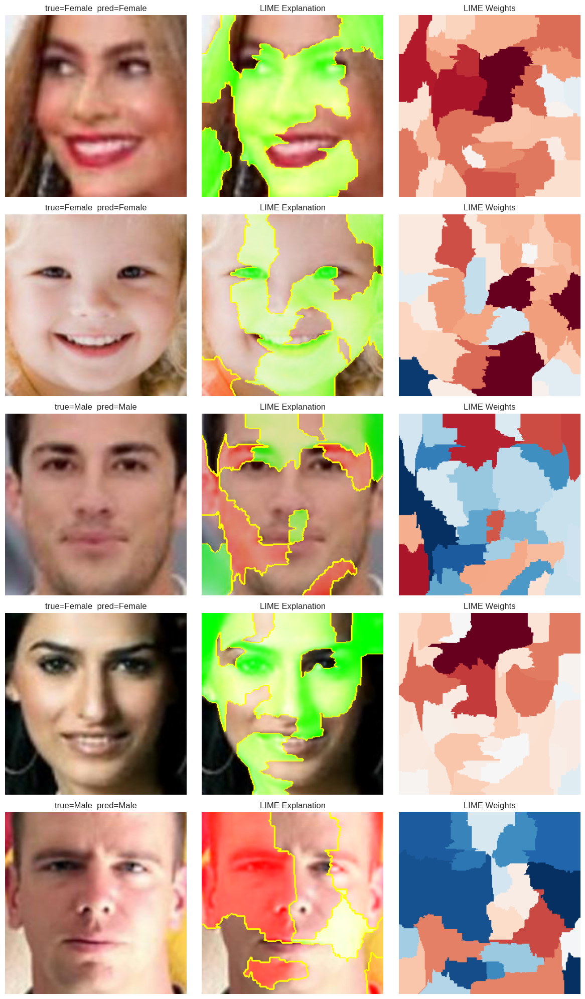

In [10]:
def lime_predict(images):
    model_cpu = model.eval().cpu()
    batch = []
    for img in images:
        t = torch.from_numpy(img).permute(2, 0, 1).float() / 255.0
        t = T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(t)
        batch.append(t)
    batch_tensor = torch.stack(batch)
    with torch.no_grad():
        logits = model_cpu(batch_tensor)
        probs = torch.sigmoid(logits)
    return np.column_stack([1-probs.cpu().numpy(), probs.cpu().numpy()])

explainer = lime_image.LimeImageExplainer()

n_show = min(5, n_samples)
fig, axes = plt.subplots(n_show, 3, figsize=(12, 4 * n_show))
axes = axes.reshape(n_show, 3)

for idx in range(n_show):
    img_t = sample_images[idx]
    img_np = denormalize_image(img_t.cpu()).numpy().transpose(1, 2, 0)
    img_uint8 = (img_np * 255).astype(np.uint8)

    explanation = explainer.explain_instance(
        img_uint8,
        lime_predict,
        labels=(1,),
        hide_color=0,
        num_samples=500,
        num_features=1000
    )

    temp, mask = explanation.get_image_and_mask(
        1, positive_only=False, num_features=10, hide_rest=False
    )


    axes[idx, 0].imshow(img_uint8)
    gender_label = "Female" if sample_genders[idx] == 1 else "Male"
    pred_label   = "Female" if predictions[idx] > 0.5 else "Male"
    axes[idx, 0].set_title(f'true={gender_label}  pred={pred_label}')
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(mark_boundaries(temp / 255.0, mask))
    axes[idx, 1].set_title('LIME Explanation')
    axes[idx, 1].axis('off')

    segs = explanation.segments
    local_weights = dict(explanation.local_exp[1])
    weight_map = np.zeros_like(segs, dtype=float)
    for seg_id, w in local_weights.items():
        weight_map[segs == seg_id] = w
    vmax = np.percentile(np.abs(weight_map), 95)
    axes[idx, 2].imshow(weight_map, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
    axes[idx, 2].set_title('LIME Weights')
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.show()

LIME показывает, что сегменты, усиливающие предсказание female (зелёные области (1) и тёмно-красные веса (2)), сосредоточены на губах и вокруг глаз, тогда как за male (красные области (1) и синие цвета (2)) выступают лоб, подбородок и челюсть и виски — то есть классические половые маркеры. У образцов с менее выраженными признаками (ребёнок) карта весов выглядит более размыто.

IG анализ

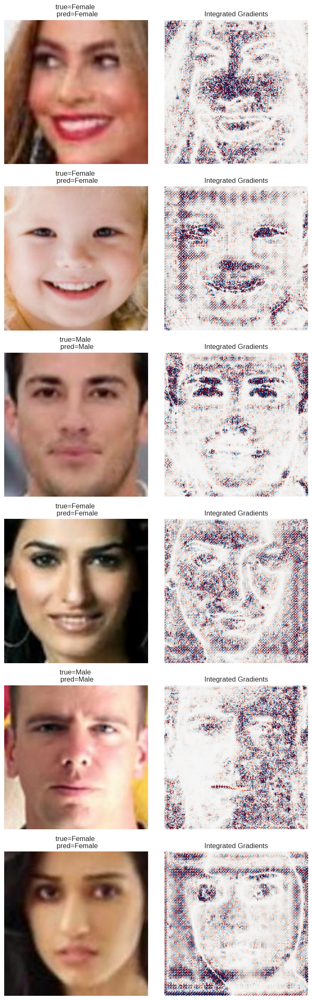

In [11]:
model_cpu = model.eval().cpu()
ig = IntegratedGradients(model_cpu)
baseline = torch.zeros_like(sample_images).cpu()

ig_attrs = []
for idx in range(n_samples):
    input_img = sample_images[idx:idx+1].cpu()
    base_img = baseline[idx:idx+1]
    attr, delta = ig.attribute(
        inputs=input_img,
        baselines=base_img,
        n_steps=30,
        internal_batch_size=1,
        return_convergence_delta=True
    )
    ig_attrs.append(attr.squeeze().numpy())

fig, axes = plt.subplots(n_samples, 2, figsize=(8, 4 * n_samples))
axes = axes.reshape(n_samples, 2)

for i in range(n_samples):
    img = sample_images[i]
    ig_attr = ig_attrs[i]

    img_vis = denormalize_image(img.cpu()).numpy().transpose(1, 2, 0)
    axes[i, 0].imshow(img_vis)
    gender_label = "Female" if sample_genders[i] == 1 else "Male"
    pred_label = "Female" if predictions[i] > 0.5 else "Male"
    axes[i, 0].set_title(f'true={gender_label} \n pred={pred_label}')
    axes[i, 0].axis('off')

    ig_gray = np.mean(ig_attr, axis=0)
    vmax = np.percentile(np.abs(ig_gray), 95)
    axes[i, 1].imshow(ig_gray, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
    axes[i, 1].set_title('Integrated Gradients')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

У IG карты получились очень шумными, но везде угадываются одни и те же черты: сильные пиксели вдоль переносицы, вокруг глаз и губ тянут к предсказанию female, а чуть более разреженные кластеры вокруг челюсти и лба — к male.

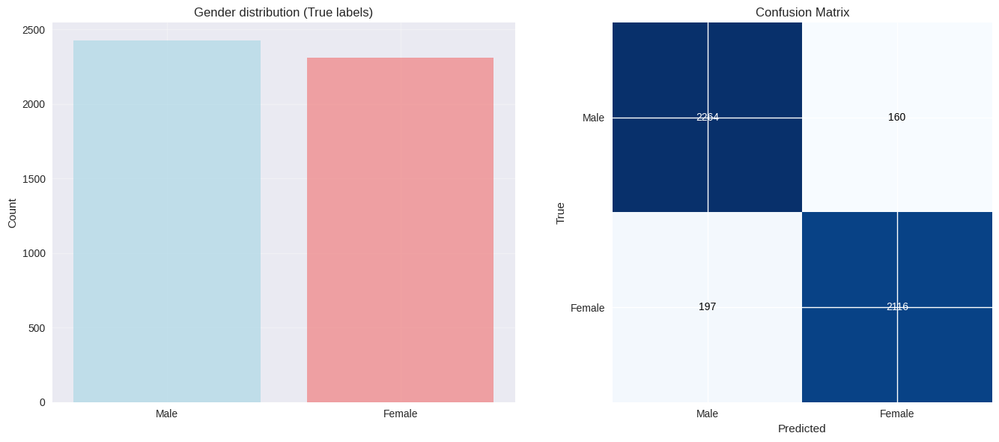

Overall Accuracy: 0.925


In [ ]:
all_preds = []
all_targets = []

model = model.to(DEVICE)
model.eval()
with torch.no_grad():
    for batch in val_loader:
        imgs, ages, genders = batch[0].to(DEVICE), batch[1], batch[2]
        logits = model(imgs).cpu().numpy().flatten()
        probs = torch.sigmoid(torch.tensor(logits)).numpy()
        all_preds.extend(probs)
        all_targets.extend(genders.numpy().flatten())

all_preds = np.array(all_preds)
all_targets = np.array(all_targets)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

male_count = np.sum(all_targets == 0)
female_count = np.sum(all_targets == 1)
axes[0].bar(['Male', 'Female'], [male_count, female_count], color=['lightblue', 'lightcoral'], alpha=0.7)
axes[0].set_title('Gender distribution (True labels)')
axes[0].set_ylabel('Count')
axes[0].grid(alpha=0.3)

pred_classes = (all_preds > 0.5).astype(int)
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(all_targets, pred_classes)
im = axes[1].imshow(cm, interpolation='nearest', cmap='Blues')
axes[1].set_title('Confusion Matrix')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
tick_marks = np.arange(2)
axes[1].set_xticks(tick_marks)
axes[1].set_yticks(tick_marks)
axes[1].set_xticklabels(['Male', 'Female'])
axes[1].set_yticklabels(['Male', 'Female'])

for i in range(2):
    for j in range(2):
        axes[1].text(j, i, format(cm[i, j], 'd'),
                     ha="center", va="center",
                     color="white" if cm[i, j] > cm.max() / 2. else "black")

plt.tight_layout()
plt.show()

accuracy = np.mean(pred_classes == all_targets)
print(f"Overall Accuracy: {accuracy:.3f}")


На валидации у нас почти поровну примеров мужчин (2264) и женщин (2116), то есть выборка слегка смещена в мужскую сторону. Из матрицы ошибок видно, что из 2424 мужчин модель правильно классифицировала 2264 (FN = 160), а из 2313 женщин — 2116 (FN = 197). Иными словами, общая точность составила около 0.92, при этом модель несколько чаще ошибается, помечая женщин как мужчин (197 ошибок). 

In [45]:
import matplotlib.pyplot as plt

def infer_and_explain_full(image_path):
    img = Image.open(image_path).convert("RGB")
    tensor = val_tf(img).unsqueeze(0).cpu()
    img_vis = (denormalize_image(tensor.squeeze()).numpy().transpose(1,2,0) * 255).astype(np.uint8)

    model_cpu = model.eval().cpu()

    with torch.no_grad():
        logit = model_cpu(tensor).item()
        prob = torch.sigmoid(torch.tensor(logit)).item()
        pred_gender = "female" if prob > 0.5 else "male"
    
    print("Pred: {}".format(pred_gender))

    orig = denormalize_image(tensor.squeeze()).numpy().transpose(1,2,0)
    segments = slic(orig, n_segments=100, compactness=10, sigma=1)
    sp_map = np.zeros_like(segments, dtype=float)
    shap_vals = explainer_shap.shap_values(tensor, nsamples=30)
    if isinstance(shap_vals, list):
        shap_vals = shap_vals[0]
    arr = np.array(shap_vals).squeeze()
    if arr.ndim == 3 and arr.shape[0] in (1,3):
        arr = arr.transpose(1,2,0)
    shap_2d = arr.mean(axis=-1) if arr.ndim==3 else arr
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        sp_map[mask] = shap_2d[mask].mean()
    overlay_sp = create_heatmap_overlay(tensor.squeeze(), sp_map, alpha=0.7)
    vmax_s = np.percentile(np.abs(shap_2d), 95)

    def lime_fn(batch_imgs):
        batch_t = []
        for im in batch_imgs:
            t = torch.from_numpy(im).permute(2,0,1).float()/255.0
            t = T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])(t)
            batch_t.append(t)
        batch_t = torch.stack(batch_t)
        with torch.no_grad():
            logits = model_cpu(batch_t)
            probs = torch.sigmoid(logits)
        return np.column_stack([1-probs.numpy(), probs.numpy()])

    lime_expl = lime_image.LimeImageExplainer()
    exp = lime_expl.explain_instance(img_vis, lime_fn, labels=(1,), hide_color=0, num_samples=500, num_features=10)
    segs = exp.segments
    local_exp = dict(exp.local_exp[1])

    num_features = 10
    abs_sorted = np.argsort(np.abs(list(local_exp.values())))[::-1][:num_features]
    important_segs = [list(local_exp.keys())[i] for i in abs_sorted]

    mask_pos = np.zeros_like(segs, dtype=bool)
    mask_neg = np.zeros_like(segs, dtype=bool)
    for sid in important_segs:
        if local_exp[sid] < 0:
            mask_pos[segs == sid] = True
        else:
            mask_neg[segs == sid] = True

    overlay = img_vis.astype(float).copy()
    alpha = 0.6
    overlay[mask_pos] = overlay[mask_pos] * (1-alpha) + np.array([0,255,0]) * alpha
    overlay[mask_neg] = overlay[mask_neg] * (1-alpha) + np.array([255,0,0]) * alpha

    lime_bound = mark_boundaries(overlay.astype(np.uint8)/255.0, segs, color=(1,1,0))

    lime_w = np.zeros_like(segs, dtype=float)
    for sid, w in local_exp.items():
        lime_w[segs==sid] = w
    vmax_l = np.percentile(np.abs(lime_w), 95)

    ig = IntegratedGradients(model_cpu)
    tensor_ig = tensor.requires_grad_()
    attributions, _ = ig.attribute(tensor_ig, target=None, return_convergence_delta=True)
    ig_map = attributions.squeeze().cpu().detach().numpy()
    if ig_map.shape[0] in (1,3):
        ig_map = ig_map.transpose(1,2,0)
    ig_2d = ig_map.mean(axis=-1) if ig_map.ndim==3 else ig_map
    vmax_ig = np.percentile(np.abs(ig_2d), 95)

    fig, axes = plt.subplots(2, 3, figsize=(15,10))
    axes = axes.flatten()

    axes[0].imshow(img_vis)
    axes[0].set_title("{}\nPred: {}".format(image_path, pred_gender))
    axes[0].axis('off')

    axes[1].imshow(overlay_sp)
    axes[1].set_title("SHAP + Superpixels")
    axes[1].axis('off')

    axes[2].imshow(shap_2d, cmap='RdBu_r', vmin=-vmax_s, vmax=vmax_s)
    axes[2].set_title("SHAP Values")
    axes[2].axis('off')

    axes[3].imshow(lime_bound)
    axes[3].set_title("LIME Explanation")
    axes[3].axis('off')

    axes[4].imshow(lime_w, cmap='RdBu', vmin=-vmax_l, vmax=vmax_l)
    axes[4].set_title("LIME Weights")
    axes[4].axis('off')

    axes[5].imshow(ig_2d, cmap='RdBu_r', vmin=-vmax_ig, vmax=vmax_ig)
    axes[5].set_title("Integrated Gradients")
    axes[5].axis('off')

    plt.tight_layout()
    plt.show()

Pred: male


  0%|          | 0/500 [00:00<?, ?it/s]

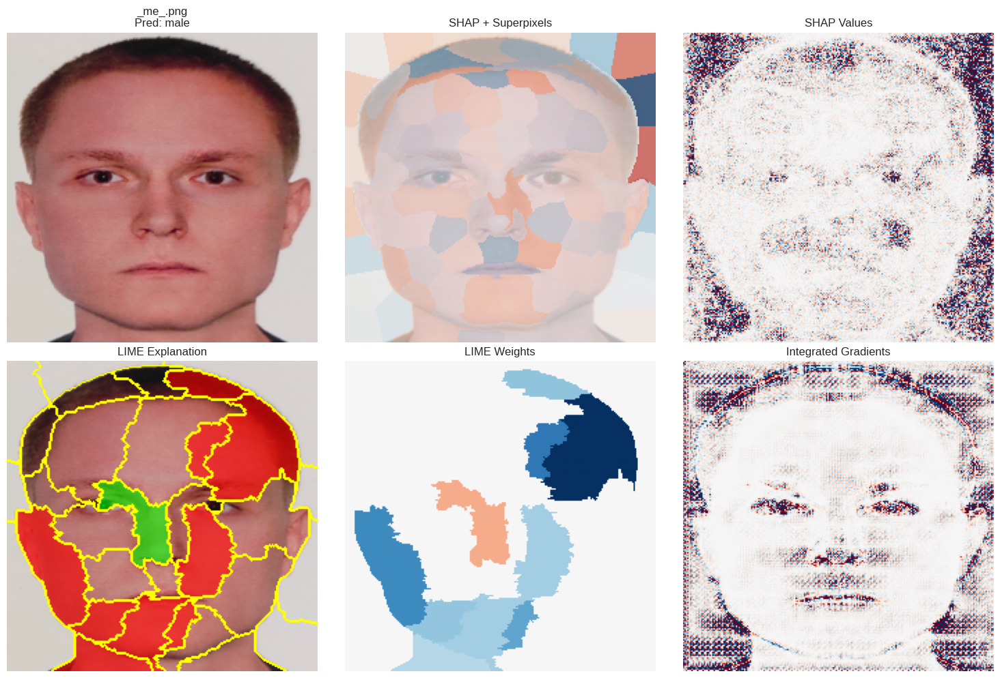

In [46]:
male_or_female = infer_and_explain_full("_me_.png")

Модель присвоила метку male потому, что все три метода интерпретации указывают на доминирующие мужские признаки: 
- в SHAP красные зоны вдоль челюсти, на подбородке и лбу показывают сильный отрицательный вклад в female и, следовательно, усиливают male; 
- в LIME male-сегменты охватывают челюсть и подбородок, а положительный вклад губ, носа и лба оказался слабым по сравнению с ними; 
- в IG наибольшая плотность цветных градиентов наблюдается именно вдоль линии челюсти и в области лба, что говорит о том, что именно эти участки лица оказались решающими для классификации как male.